In [240]:
%%time
import pandas as pd
import os
import numpy as np
import ants
from tqdm import tqdm
import shutil
import nibabel as nib

CPU times: user 54 µs, sys: 3 µs, total: 57 µs
Wall time: 95.1 µs


In [241]:
outdir = '~/data/sfari_bids/'
outdir = os.path.expanduser(outdir)
site = 50
ds_dir = os.path.join(outdir,f'ds-sfari-{site}')
print(ds_dir)

/data/aglinska/data/sfari_bids/ds-sfari-50


In [242]:
%%time
if not os.path.exists(ds_dir+'orfix'):
    shutil.copytree(src=ds_dir, dst=ds_dir+'orfix')
ds_dir = ds_dir+'orfix'

CPU times: user 309 ms, sys: 15.1 s, total: 15.5 s
Wall time: 32 s


In [262]:
ds_dir

'/data/aglinska/data/sfari_bids/ds-sfari-50orfix'

In [244]:
df_sfari = pd.read_csv('../Data/sfari0.csv')
site_df = df_sfari.iloc[df_sfari['site_ids'].values==site]
site_df.head()
print(site_df.shape)

(84, 4)


In [245]:
def reorigin(im):
    im2 = im.copy()
    im2.set_origin(tuple(np.array(im2.origin)-np.array(im2.get_center_of_mass())))
    return im2

In [246]:
def flip_scan_upsidedown(im):
    im2 = im.copy()
    if len(im_func3f.shape)==3:
        im2 = im2.new_image_like(im2.numpy()[0::,0::,-1::-1])
    elif len(im_func3f.shape)==4:
        im2 = im2.new_image_like(im2.numpy()[0::,0::,-1::-1,:])
    return im2

In [260]:
to_flip50 = [2,3,7,17,22,23,24,29,38,42,47,48,51,53,57,58,61,63,69,70,73,77,80,91,94,95,97,100,109,119,122,123,127,128,134,139,141,151,155,158,165,166,167,172,175,183,188,191,197,201,208]
to_flip50 = [f'sub-{i:03d}' for i in to_flip50]

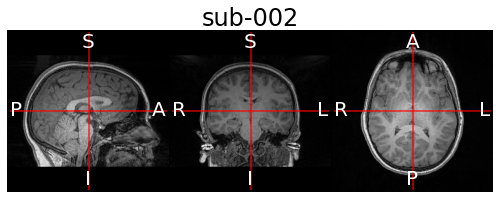

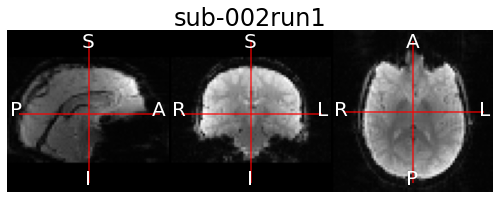

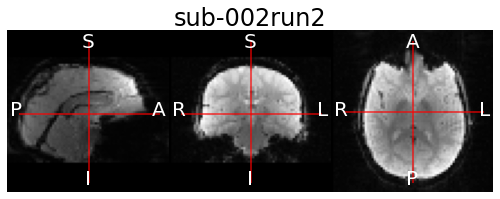

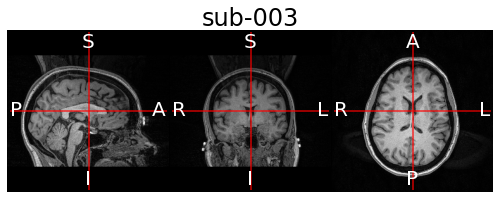

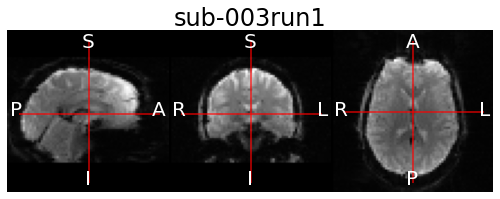

...

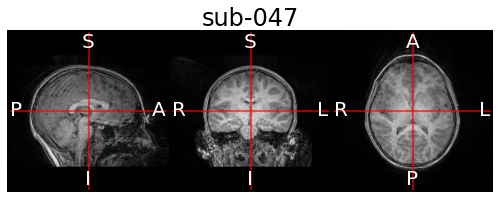

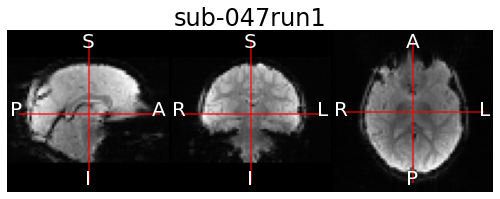

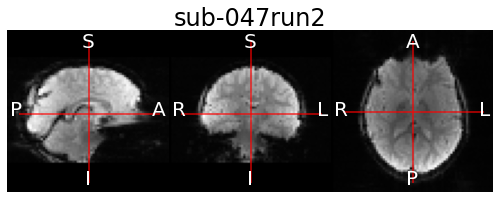

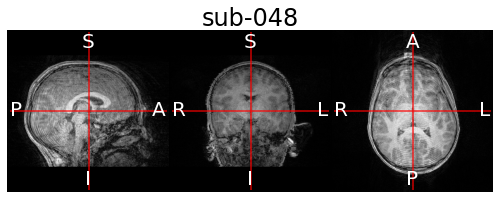

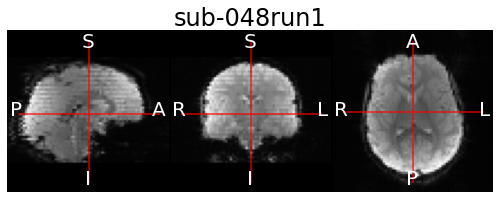

not found: /data/aglinska/data/sfari_bids/ds-sfari-50orfix/sub-048/func/sub-048_task-rest_run-2_bold.nii.gz


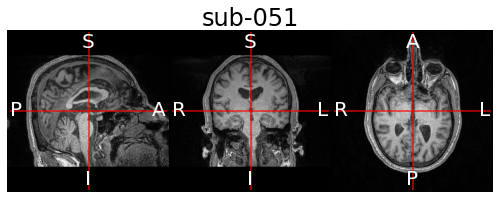

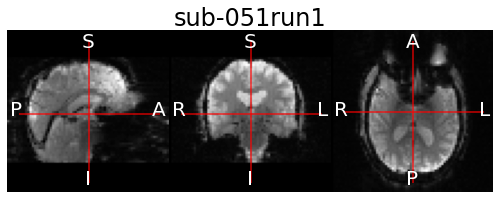

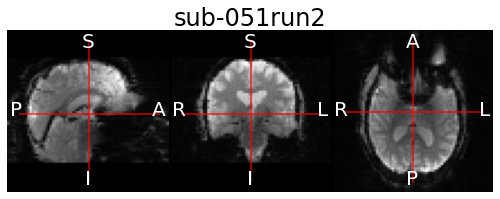

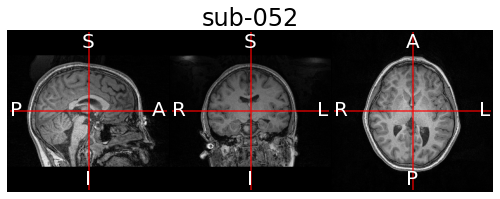

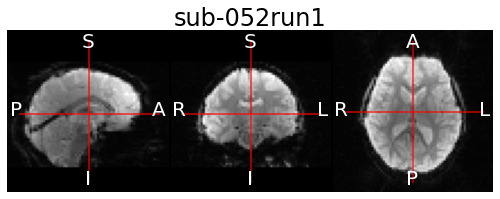

...

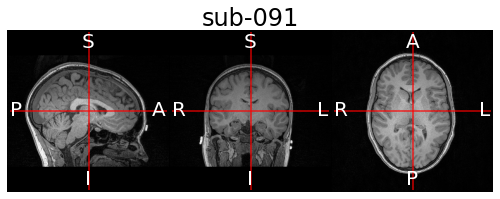

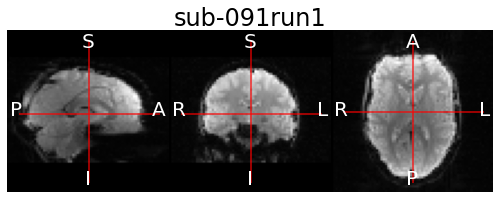

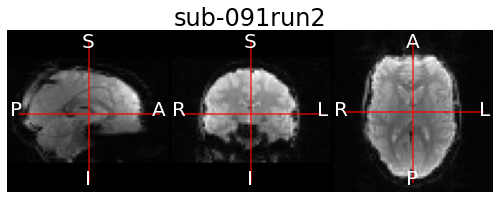

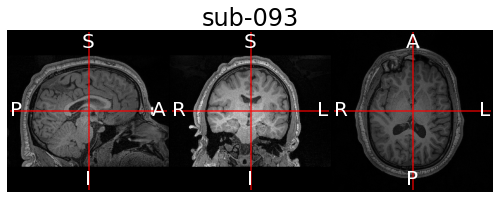

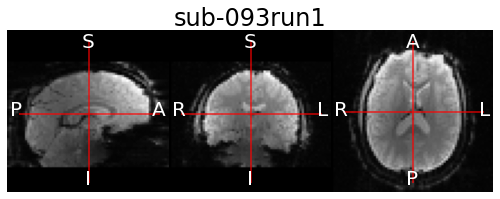

not found: /data/aglinska/data/sfari_bids/ds-sfari-50orfix/sub-093/func/sub-093_task-rest_run-2_bold.nii.gz


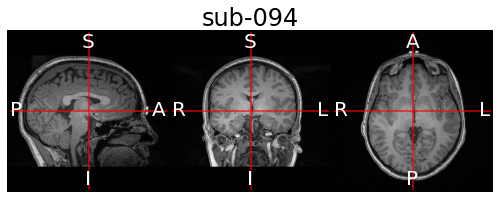

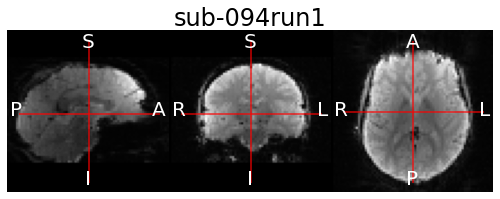

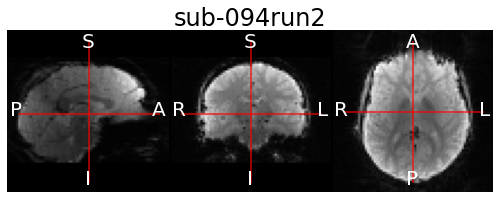

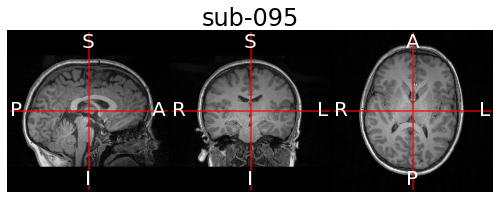

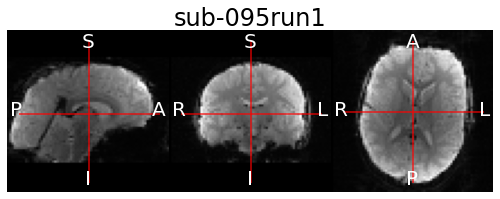

...

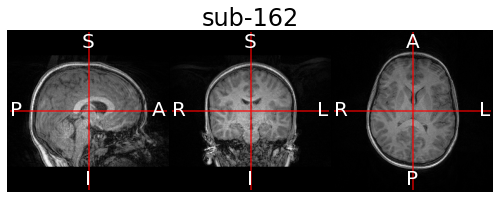

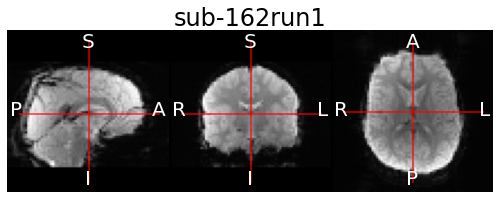

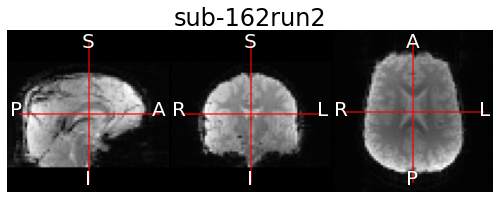

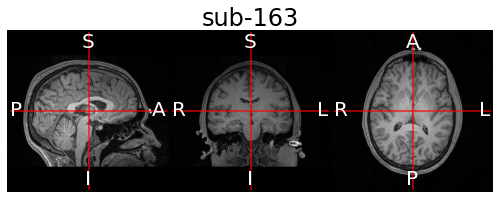

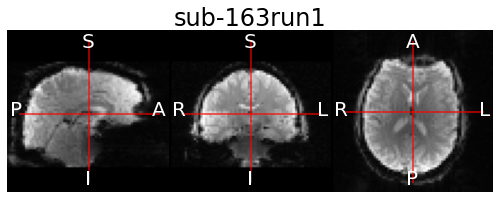

not found: /data/aglinska/data/sfari_bids/ds-sfari-50orfix/sub-163/func/sub-163_task-rest_run-2_bold.nii.gz


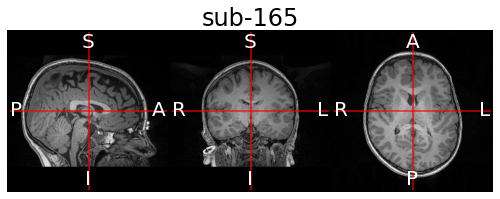

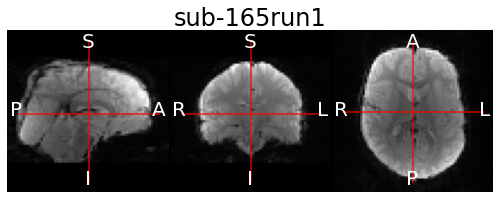

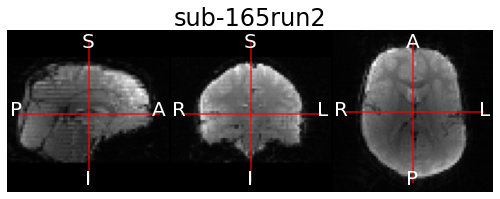

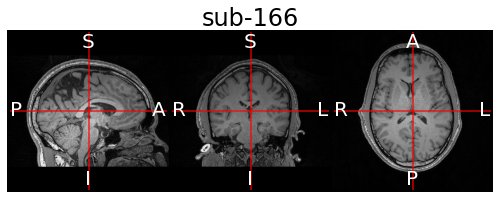

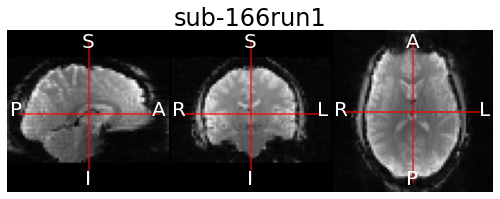

...

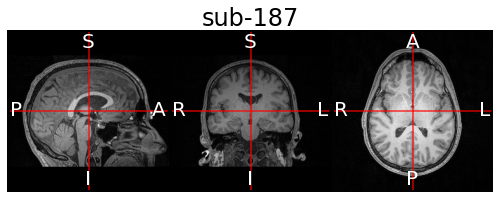

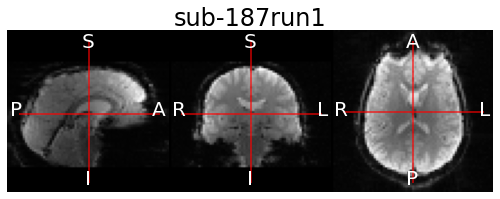

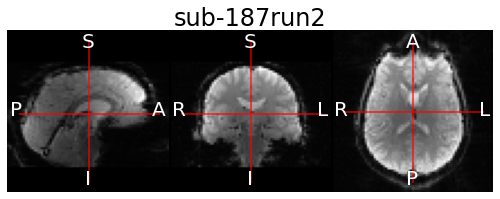

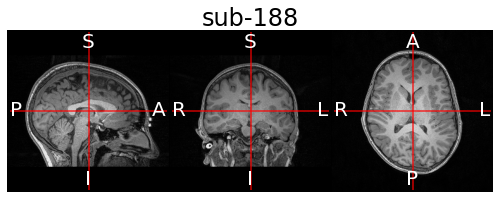

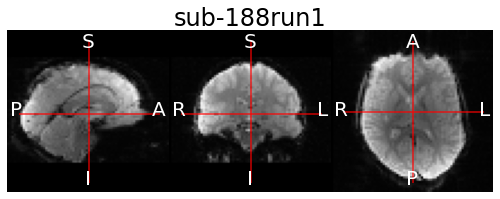

not found: /data/aglinska/data/sfari_bids/ds-sfari-50orfix/sub-188/func/sub-188_task-rest_run-2_bold.nii.gz


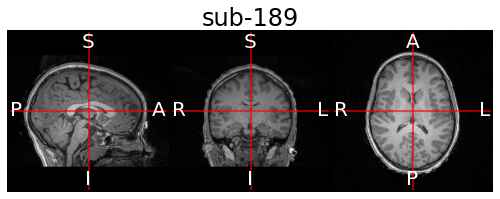

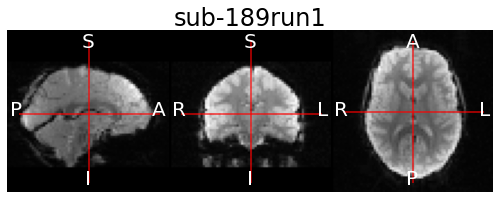

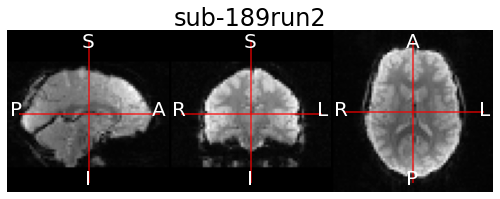

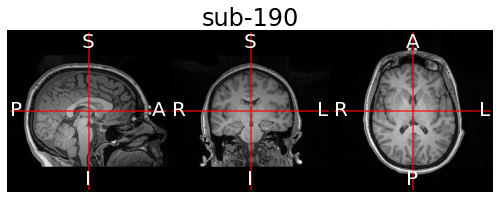

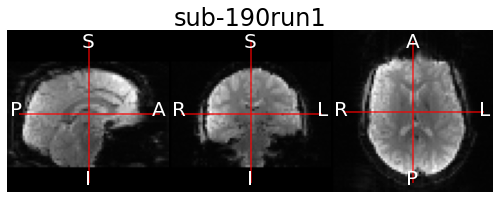

...

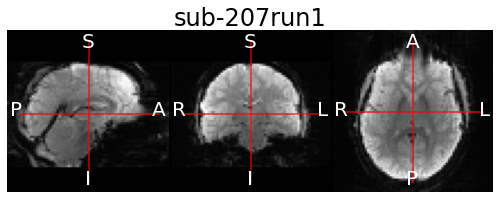

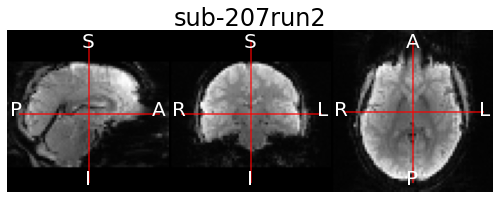

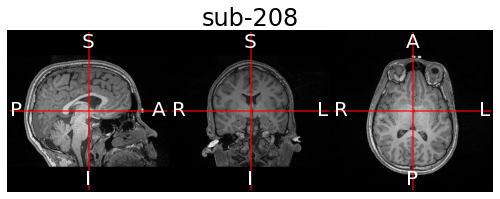

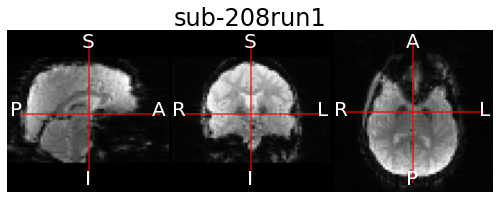

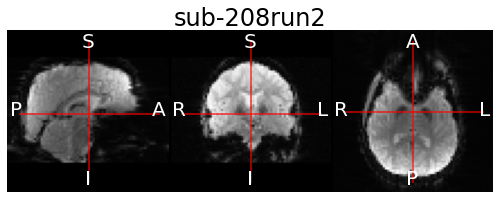

CPU times: user 54min 48s, sys: 45.4 s, total: 55min 33s
Wall time: 1h 1min 55s


In [261]:
%%time
for s in range(site_df.shape[0]):
    sub = site_df['subID'].values[s]
    im_anat = ants.image_read(os.path.join(ds_dir,sub,'anat',f'{sub}_T1w.nii.gz'))
    im_anat = reorigin(im_anat) # REORIGIN ANAT
    im_anat.plot_ortho(flat=True,title=sub)
    im_anat.to_filename(os.path.join(ds_dir,sub,'anat',f'{sub}_T1w.nii.gz'))    
    
    if os.path.exists(os.path.join(ds_dir,sub,'func',f'{sub}_task-rest_run-1_bold.nii.gz')):
        im_func = ants.image_read(os.path.join(ds_dir,sub,'func',f'{sub}_task-rest_run-1_bold.nii.gz'))
        
        if sub in to_flip50:
            im_func = flip_scan_upsidedown(im_func) # FIX ORIENTATION
            
        im_func = reorigin(im_func) # REORIGIN FUNC
        ants.slice_image(im_func,axis=3,idx=0).plot_ortho(flat=True,title=sub+'run1')
        im_func.to_filename(os.path.join(ds_dir,sub,'func',f'{sub}_task-rest_run-1_bold.nii.gz'))
    else:
        print('not found: {}'.format(os.path.join(ds_dir,sub,'func',f'{sub}_task-rest_run-1_bold.nii.gz')))
        
    if os.path.exists(os.path.join(ds_dir,sub,'func',f'{sub}_task-rest_run-2_bold.nii.gz')):
        im_func = ants.image_read(os.path.join(ds_dir,sub,'func',f'{sub}_task-rest_run-2_bold.nii.gz'))
        
        if sub in to_flip50:
            im_func = flip_scan_upsidedown(im_func) # FIX ORIENTATION
            
        im_func = reorigin(im_func) # REORIGIN FUNC
        ants.slice_image(im_func,axis=3,idx=0).plot_ortho(flat=True,title=sub+'run2')
        im_func.to_filename(os.path.join(ds_dir,sub,'func',f'{sub}_task-rest_run-2_bold.nii.gz'))
    else:
        print('not found: {}'.format(os.path.join(ds_dir,sub,'func',f'{sub}_task-rest_run-2_bold.nii.gz')))

In [263]:
# Remove subjects with no fMRI or MOSAIC fMRI
subs = [sub for sub in os.listdir(ds_dir) if sub.startswith('sub-')]
subs.sort()
for s in range(len(subs)):
    sub = subs[s]
    func_fn = os.path.join(ds_dir,sub,'func',f'{sub}_task-rest_run-1_bold.nii.gz')
    if not os.path.exists(func_fn):
        shutil.rmtree(os.path.join(ds_dir,sub))
        print(f'{sub} : no run1, removing sub')

    im = ants.image_read(func_fn)
    if im.shape[0] > 100:
        shutil.rmtree(os.path.join(ds_dir,sub))
        print(f'{sub} : mosaic, removing sub')

In [265]:
# FIX THE HEADER INFORMATON (mm sec)
subs = [sub for sub in os.listdir(ds_dir) if sub.startswith('sub-')]
subs.sort()
for s in tqdm(range(len(subs))):
    for r in (1,2):
        sub = subs[s]
        func_fn = os.path.join(ds_dir,sub,'func',f'{sub}_task-rest_run-{r}_bold.nii.gz')
        if os.path.exists(func_fn):
            im = nib.load(func_fn)
            header = im.header.copy()
            header.set_xyzt_units(xyz='mm', t='sec')
            nib.nifti1.Nifti1Image(im.get_fdata(), None, header=header).to_filename(func_fn)

100%|██████████| 84/84 [10:20<00:00,  7.39s/it]


In [235]:
subs = [sub for sub in os.listdir(ds_dir) if sub.startswith('sub-')]
subs.sort()

In [236]:
len(subs)

122

In [ ]:
!date